# Amazon Bin Image Dataset - Objects Counting

This notebook shows the step by step codes to solve the objects counting problem of Amazon Bin Image Dataset using SageMaker.
- Dataset Preparation: ETL using Sagemaker processing job
- HyperParameters Tuning: Sagemaker hyperparameters tuner
- Model Training: Sagemaker profiler and debugger, Sagemaker Pytorch training
- Model Evaluation: Sagemaker batch transform
- Model Deployment: Sagemaker endpoint

## Install needed packages

In [59]:
! pip install boto3 sagemaker smdebug scikit-learn

## Import needed packages

In [2]:
import boto3
import sagemaker
session = boto3.Session()

sagemaker_session = sagemaker.Session()

sagemaker_client = session.client('sagemaker')
s3_client = session.client('s3')
role = sagemaker.get_execution_role()

## I. Prepare DataSet

Since Amazon Bin Image Dataset is huge, we will need to extract a small portion for training. And the benchmark model uses moderate data which includes image data contains objects < 6. We will extract the small portion data using **Amazon Sagemaker Processing Job**. Then we will split the selected data, and upload the images to S3 bucket for training.

### 1) upload the small target data need to extract to S3, the file is from: http://www.cs.unc.edu/~eunbyung/abidc/random_val.txt

We will process 10% of data (53523) in dataset in the processing job.

In [52]:
with open('random_val.txt', 'r') as f:
    d=f.readlines()
print("Total Data: ", len(d))
# upload data list file
BUCKET = "aws-bin-image"
response = s3_client.upload_file('random_val.txt', BUCKET, 'random_val.txt')

INFO:botocore.credentials:Found credentials in shared credentials file: ~/.aws/credentials


Total Data:  53523


### 2) start a sagemaker processing job, to get a file of all image data names with desired label (0 - 5)

In [31]:
from sagemaker.sklearn.processing import SKLearnProcessor
from sagemaker.processing import ProcessingInput, ProcessingOutput

sklearn_processor = SKLearnProcessor(framework_version='0.20.0',
                                     role=role,
                                     instance_type='ml.m5.large',
                                     instance_count=1)

sklearn_processor.run(code='processing_data.py',
                      inputs=[ProcessingInput(source='s3://aft-vbi-pds/metadata/',destination='/opt/ml/processing/input'),
                              ProcessingInput(source='s3://aws-bin-image/random_val.txt', destination='/opt/ml/processing/txtfile')],
                      outputs=[ProcessingOutput(source='/opt/ml/processing/output', s3_upload_mode='Continuous')],
                     )


INFO:sagemaker.image_uris:Defaulting to only available Python version: py3
INFO:sagemaker:Creating processing-job with name sagemaker-scikit-learn-2023-03-04-11-13-52-738


.............................................
..

### 3) Download the processing output JSON file, and split data to train, val, test. Draw barplot showing class distribution

In the train test split, we split the data in to 20% test, 16% val, and 64% train.
From the class distribution plot, we can see that the dataset has a serious class imbalance problem, which needs to be consider and taking care of in the training stage.

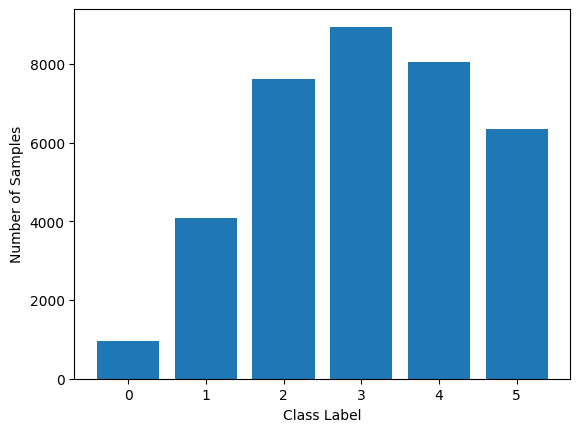

In [4]:
import matplotlib.pyplot as plt
import json

from sklearn.model_selection import train_test_split

with open('val.json', 'r') as f:
    data=json.load(f)

train_data = {}
val_data = {}
test_data = {}

for label, files in data.items():
    train_files, test_files = train_test_split(files, test_size=0.2, random_state=42)
    train_files, val_files = train_test_split(train_files, test_size=0.2, random_state=42)
    train_data[label] = train_files
    val_data[label] = val_files
    test_data[label] = test_files

# Get the number of samples in each class
class_counts = [len(train_data[str(i)]) + len(val_data[str(i)]) + len(test_data[str(i)]) for i in range(len(data))]

# Plot the bar chart
plt.bar(list(data.keys()), class_counts)
plt.xlabel('Class Label')
plt.ylabel('Number of Samples')
plt.show()

### 4) Copy the selected train, val, test data to S3, with subfolder names as their Groud Truth label name

In [12]:
def download_and_arrange_data(data, output_path):
    src_bucket = 'aft-vbi-pds'
    dst_bucket = 'bin-image-data'
    for label, file_list in data.items():
        print(f"Downloading Images with {label} objects,{len(file_list)}")
        for file in file_list:
            src_key = f'bin-images/{file}'
            dst_key = f'{output_path}/{label}/{file}'
            print(src_key, dst_key)

            # Copy the file from the source bucket to the destination bucket
            s3_client.copy_object(
                Bucket=dst_bucket,
                CopySource={'Bucket': src_bucket, 'Key': src_key},
                Key=dst_key)

download_and_arrange_data(train_data, 'train')
download_and_arrange_data(val_data, 'val')
download_and_arrange_data(test_data, 'test')

bin-images/347302.jpg train/0/347302.jpg
bin-images/102062.jpg train/0/102062.jpg
bin-images/402924.jpg train/0/402924.jpg
bin-images/144828.jpg train/0/144828.jpg
bin-images/420387.jpg train/0/420387.jpg
bin-images/162274.jpg train/0/162274.jpg
bin-images/25476.jpg train/0/25476.jpg
bin-images/119918.jpg train/0/119918.jpg
bin-images/315467.jpg train/0/315467.jpg
bin-images/350247.jpg train/0/350247.jpg
bin-images/523783.jpg train/0/523783.jpg
bin-images/73946.jpg train/0/73946.jpg
bin-images/81324.jpg train/0/81324.jpg
bin-images/361512.jpg train/0/361512.jpg
bin-images/415149.jpg train/0/415149.jpg
bin-images/374113.jpg train/0/374113.jpg
bin-images/418881.jpg train/0/418881.jpg
bin-images/34314.jpg train/0/34314.jpg
bin-images/192409.jpg train/0/192409.jpg
bin-images/185875.jpg train/0/185875.jpg
bin-images/436816.jpg train/0/436816.jpg
bin-images/256769.jpg train/0/256769.jpg
bin-images/93639.jpg train/0/93639.jpg
bin-images/320181.jpg train/0/320181.jpg
bin-images/209829.jpg trai

### 5) Select one example image from each class and display

Label: 0,Label: 1,Label: 2
Label: 3,Label: 4,Label: 5

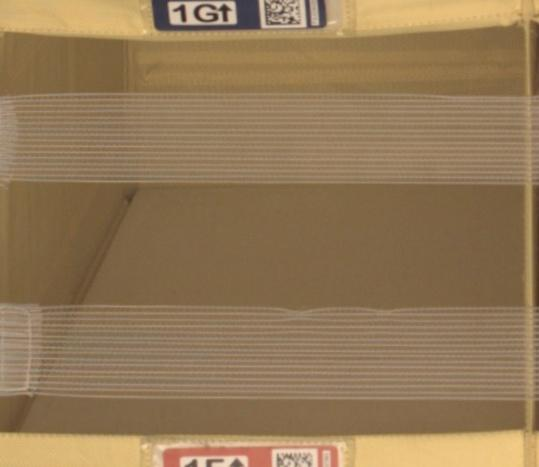
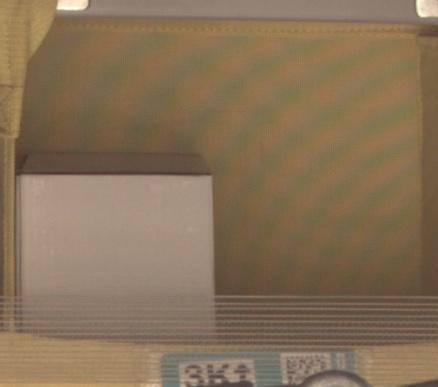
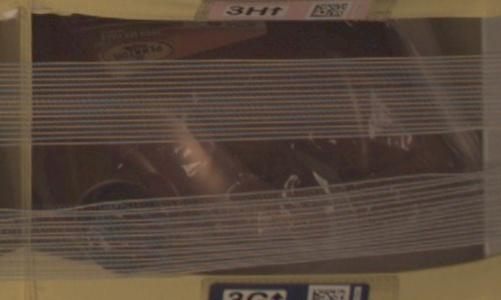
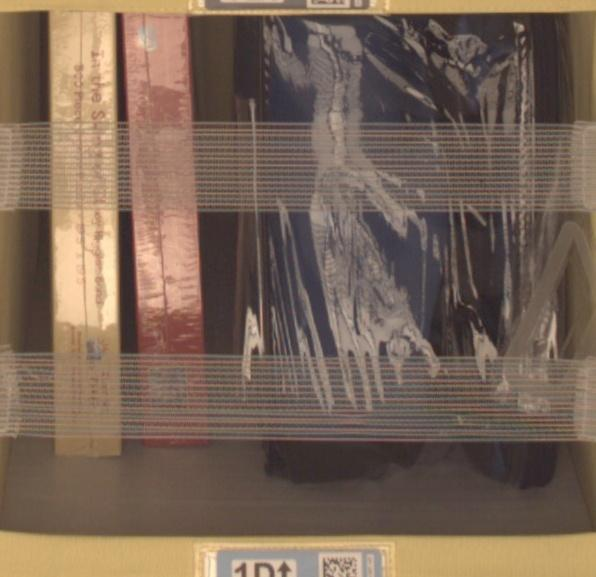
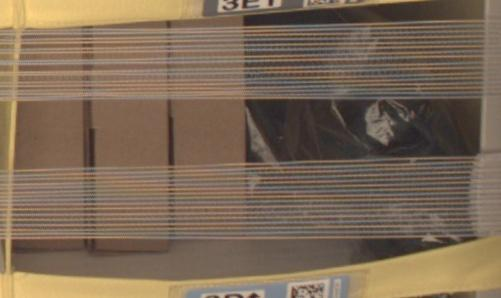
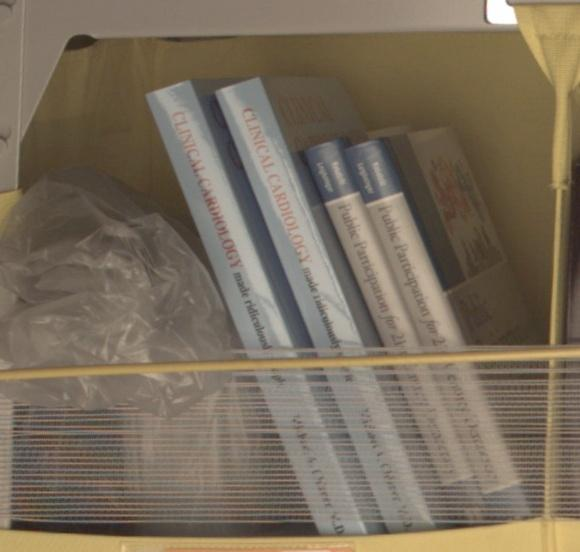

In [22]:
# select some image and display
from base64 import b64encode
import boto3
from PIL import Image
import io
import IPython.display as display

# Initialize the S3 client
s3 = boto3.client('s3')

# Set the S3 bucket name and keys (paths) of the images and their titles
bucket_name = 'bin-image-data'
image_data = [
    (f'train/0/{train_data["0"][0]}', 'Label: 0'),
    (f'train/1/{train_data["1"][0]}', 'Label: 1'),
    (f'train/2/{train_data["2"][0]}', 'Label: 2'),
    (f'train/3/{train_data["3"][0]}', 'Label: 3'),
    (f'train/4/{train_data["4"][0]}', 'Label: 4'),
    (f'train/5/{train_data["5"][0]}', 'Label: 5'),
]

# Create an HTML table to display the images with captions
table_html = '<h2>Samples of Bin Image Dataset</h2><table>'
for i in range(0, len(image_data), 3):
    table_html += '<tr>'
    for j in range(i, min(i + 3, len(image_data))):
        # Get the key (path) and title of the image
        image_key, image_title = image_data[j]

        # Download the image from S3 to a byte stream
        response = s3.get_object(Bucket=bucket_name, Key=image_key)
        image_bytes = io.BytesIO(response['Body'].read())

        # Open the image using the Pillow library
        image = Image.open(image_bytes)

        # Create a base64-encoded string of the image data
        image_data_string = io.BytesIO()
        image.save(image_data_string, format='JPEG')
        image_data_string = image_data_string.getvalue()
        image_data_string = 'data:image/jpeg;base64,' + str(b64encode(image_data_string), 'utf-8')

        # Add the image and title to the HTML table with a caption
        table_html += '<td><figure><img src="{}"/><figcaption>{}</figcaption></figure></td>'.format(image_data_string, image_title)
    table_html += '</tr>'
table_html += '</table>'

# Display the HTML table in the Jupyter notebook
display.display(display.HTML(table_html))

## II. Hyperparameters Tuning

To solve this 6 class image classification problem, we will use ResNet50 as our model. Before training, we need to select best hyperparameters for this task. The two hyperparameter we will tune is learning rate and batch size.

### 1) define hyperparameter range and objective metric

The hyperparameters `lr` and `batch-size` are being tuned to find the combination that yields the highest testing accuracy for the model. The learning rate controls the convergence and accuracy of the model, while the batch size affects the training time, memory usage, and convergence rate. 

In [26]:
from sagemaker.tuner import (
    CategoricalParameter,
    ContinuousParameter,
    HyperparameterTuner,
)
from sagemaker.pytorch import PyTorch

hyperparameter_ranges = {
    "lr": ContinuousParameter(0.001, 0.1),
    "batch-size": CategoricalParameter([32, 64, 128, 256, 512]),
}

objective_metric_name = "Testing Accuracy"
objective_type = "Maximize"
metric_definitions = [{"Name": "Testing Accuracy", "Regex": "Testing Accuracy: ([0-9\\.]+)"}]

### 2) init pytorch estimator with hpo.py and HyperparameterTuner

In [ ]:
estimator = PyTorch(
    entry_point="hpo.py",
    role=role,
    py_version='py36',
    framework_version="1.8",
    instance_count=1,
    instance_type="ml.m5.xlarge"
)

tuner = HyperparameterTuner(
    estimator,
    objective_metric_name,
    hyperparameter_ranges,
    metric_definitions,
    max_jobs=4,
    max_parallel_jobs=2,
    objective_type=objective_type,
)

### 3) Start training jobs of hyperparameters tuning

In [36]:
tuner.fit({"training": "s3://bin-image-data"})

No finished training job found associated with this estimator. Please make sure this estimator is only used for building workflow config
No finished training job found associated with this estimator. Please make sure this estimator is only used for building workflow config


.....................................................................................................................................................................................................................................................................................................................................................................................................................................................!


### 4) show best hyperparameters found based on the objective metric

In [37]:
best_estimator = tuner.best_estimator()

#Get the hyperparameters of the best trained model
best_estimator.hyperparameters()


2023-03-05 10:31:10 Starting - Found matching resource for reuse
2023-03-05 10:31:10 Downloading - Downloading input data
2023-03-05 10:31:10 Training - Training image download completed. Training in progress.
2023-03-05 10:31:10 Uploading - Uploading generated training model
2023-03-05 10:31:10 Completed - Resource released due to keep alive period expiry


{'_tuning_objective_metric': '"Testing Accuracy"',
 'batch-size': '"128"',
 'lr': '0.00333343172085924',
 'sagemaker_container_log_level': '20',
 'sagemaker_estimator_class_name': '"PyTorch"',
 'sagemaker_estimator_module': '"sagemaker.pytorch.estimator"',
 'sagemaker_job_name': '"pytorch-training-2023-03-05-09-57-14-058"',
 'sagemaker_program': '"hpo.py"',
 'sagemaker_region': '"us-east-1"',
 'sagemaker_submit_directory': '"s3://sagemaker-us-east-1-062793089736/pytorch-training-2023-03-05-09-57-14-058/source/sourcedir.tar.gz"'}

## III. Training Model

### 1) Set up profiler and debugger for model training

In order to better monitor the training process, we can setup debugger and profiler to help us. In this case we preset overfit, overtraining monitoring and lowGPU profiler as well as the profiler report

In [39]:
from sagemaker.debugger import (
    Rule,
    DebuggerHookConfig,
    ProfilerRule,
    rule_configs,
)

from sagemaker.debugger import DebuggerHookConfig, ProfilerConfig, FrameworkProfile


rules = [
    ProfilerRule.sagemaker(rule_configs.LowGPUUtilization()),
    ProfilerRule.sagemaker(rule_configs.ProfilerReport()),
    Rule.sagemaker(rule_configs.overfit()),
    Rule.sagemaker(rule_configs.overtraining()),
]

profiler_config = ProfilerConfig(
    system_monitor_interval_millis=500, framework_profile_params=FrameworkProfile(num_steps=10)
)
debugger_config = DebuggerHookConfig(
    hook_parameters={"train.save_interval": "100", "eval.save_interval": "10"}
)

### 2) Start training job with best hyperparameters

Here we use multi-instance training to speed up the training process. Consider limited budget, we will train for 20 epochs. And as mentioned before, we need to add extra care for the imbalance classes. More details can be found in train_model.py or the report.

In [60]:
hyperparameters = {
    "batch-size": 128,
    "epoch": 20,
    "lr": "0.00333343172085924",
}

estimator = PyTorch(
    role=role,
    instance_count=2,
    instance_type="ml.g4dn.xlarge",
    entry_point="train_model.py",
    framework_version="1.8",
    py_version="py36",
    hyperparameters=hyperparameters,
    rules=rules,
    debugger_hook_config=debugger_config,
    profiler_config=profiler_config,
)

estimator.fit({"training": "s3://bin-image-data"})

### 3) save the debugger and profiler report

The debugger drawing of `CrossEntropyLoss_output_0` shows that the model is undertrain, with train loss and val loss both big. And from the profiler report we can see none of the preset rules are triggered. But if Error found is overfitting. To solve overfitting, we can add early stopping, which stop training based on loss not decreasing instead of training through all epochs and cause overfit.

In [2]:
model_location=estimator.model_data
print("trained model location:", model_location)
latest_job_debugger_artifacts_path = estimator.latest_job_debugger_artifacts_path()

trained model location: s3://sagemaker-us-east-1-062793089736/pytorch-training-2023-03-05-14-13-48-482/output/model.tar.gz


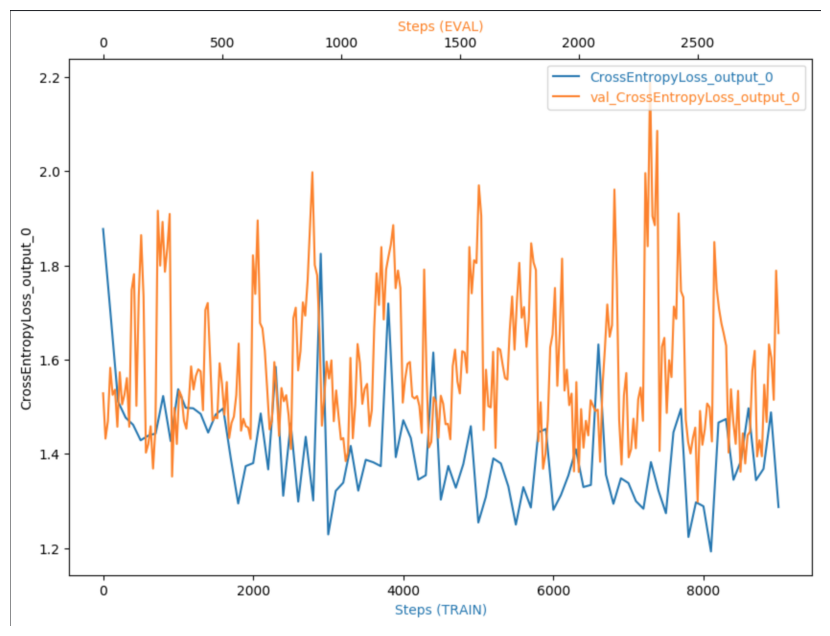

In [64]:
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import host_subplot

from smdebug.trials import create_trial
from smdebug.core.modes import ModeKeys

trial = create_trial(latest_job_debugger_artifacts_path)

def get_data(trial, tname, mode):
    tensor = trial.tensor(tname)
    steps = tensor.steps(mode=mode)
    vals = []
    for s in steps:
        vals.append(tensor.value(s, mode=mode))
    return steps, vals


def plot_tensor(trial, tensor_name):

    steps_train, vals_train = get_data(trial, tensor_name, mode=ModeKeys.TRAIN)
    steps_eval, vals_eval = get_data(trial, tensor_name, mode=ModeKeys.EVAL)

    fig = plt.figure(figsize=(10, 7))
    host = host_subplot(111)

    par = host.twiny()

    host.set_xlabel("Steps (TRAIN)")
    par.set_xlabel("Steps (EVAL)")
    host.set_ylabel(tensor_name)

    (p1,) = host.plot(steps_train, vals_train, label=tensor_name)
    (p2,) = par.plot(steps_eval, vals_eval, label="val_" + tensor_name)
    leg = plt.legend()

    host.xaxis.get_label().set_color(p1.get_color())
    leg.texts[0].set_color(p1.get_color())

    par.xaxis.get_label().set_color(p2.get_color())
    leg.texts[1].set_color(p2.get_color())

    plt.ylabel(tensor_name)

    plt.show()

plot_tensor(trial, "CrossEntropyLoss_output_0")


In [3]:
training_job_name = estimator.latest_training_job.name
print(f"Training jobname: {training_job_name}")

Training jobname: pytorch-training-2023-03-05-14-13-48-482


In [8]:
# TODO: Display the profiler output

rule_output_path = estimator.output_path + training_job_name + "/rule-output"
! aws s3 ls {rule_output_path} --recursive
! aws s3 cp {rule_output_path} ./ --recursive

2023-03-06 05:15:51     460497 pytorch-training-2023-03-05-14-13-48-482/rule-output/ProfilerReport/profiler-output/profiler-report.html
2023-03-06 05:15:50     322283 pytorch-training-2023-03-05-14-13-48-482/rule-output/ProfilerReport/profiler-output/profiler-report.ipynb
2023-03-06 05:15:43        193 pytorch-training-2023-03-05-14-13-48-482/rule-output/ProfilerReport/profiler-output/profiler-reports/BatchSize.json
2023-03-06 05:15:43    1076367 pytorch-training-2023-03-05-14-13-48-482/rule-output/ProfilerReport/profiler-output/profiler-reports/CPUBottleneck.json
2023-03-06 05:15:43       1948 pytorch-training-2023-03-05-14-13-48-482/rule-output/ProfilerReport/profiler-output/profiler-reports/Dataloader.json
2023-03-06 05:15:44        500 pytorch-training-2023-03-05-14-13-48-482/rule-output/ProfilerReport/profiler-output/profiler-reports/GPUMemoryIncrease.json
2023-03-06 05:15:44       1955 pytorch-training-2023-03-05-14-13-48-482/rule-output/ProfilerReport/profiler-output/profiler-re

## IV. Evaluate Model

To evaluate the model performance, we will run sagemaker batch transform on the test dataset and calculate its accuracy RMSE and per class accuracy and RMSE.

### 1) create batch transform job

In [68]:
# transformer = estimator.transformer(instance_count=1, instance_type="ml.g4dn.xlarge")

INFO:sagemaker:Creating model with name: pytorch-training-2023-03-05-13-20-25-317


In [10]:
from sagemaker.pytorch import PyTorchModel
# Create PyTorchModel from saved model artifact
pytorch_model = PyTorchModel(
    model_data=model_location,
    role=role,
    framework_version="1.8",
    py_version="py36",
    entry_point="train_model.py",
)

# Create transformer from PyTorchModel object
transformer = pytorch_model.transformer(instance_count=1, instance_type="ml.g4dn.xlarge")

In [11]:
transformer.transform(
    data='s3://bin-image-data/test',
    data_type="S3Prefix",
    content_type="application/x-image",
    wait=True,
)

INFO:sagemaker:Creating transform job with name: pytorch-inference-2023-03-06-01-49-10-870


.................................2023-03-06T01:55:27.346:[sagemaker logs]: MaxConcurrentTransforms=1, MaxPayloadInMB=6, BatchStrategy=MULTI_RECORD
2023-03-06 01:55:25,070 [INFO ] main org.pytorch.serve.servingsdk.impl.PluginsManager - Initializing plugins manager...
2023-03-06 01:55:25,245 [INFO ] main org.pytorch.serve.ModelServer - 
Torchserve version: 0.4.0
TS Home: /opt/conda/lib/python3.6/site-packages
Current directory: /
Temp directory: /tmp
Number of GPUs: 1
Number of CPUs: 4
Max heap size: 2988 M
Python executable: /opt/conda/bin/python3.6
Config file: /etc/sagemaker-ts.properties
Inference address: http://0.0.0.0:8080
Management address: http://0.0.0.0:8080
Metrics address: http://127.0.0.1:8082
Model Store: /.sagemaker/ts/models
Initial Models: model.mar
2023-03-06 01:55:25,070 [INFO ] main org.pytorch.serve.servingsdk.impl.PluginsManager - Initializing plugins manager...
2023-03-06 01:55:25,245 [INFO ] main org.pytorch.serve.ModelServer - 
Torchserve version: 0.4.0
TS Home:

### 2) download batch transform inference results

In [13]:
import pprint
import boto3

# Create a SageMaker client
sm = boto3.client('sagemaker')

# List transform jobs
transform_jobs = sm.list_transform_jobs()["TransformJobSummaries"]

# Print a summary of each transform job
for job in transform_jobs:
    pprint.pprint(job)

{'CreationTime': datetime.datetime(2023, 3, 6, 12, 49, 12, 968000, tzinfo=tzlocal()),
 'LastModifiedTime': datetime.datetime(2023, 3, 6, 13, 7, 33, 95000, tzinfo=tzlocal()),
 'TransformEndTime': datetime.datetime(2023, 3, 6, 13, 7, 32, 650000, tzinfo=tzlocal()),
 'TransformJobArn': 'arn:aws:sagemaker:us-east-1:062793089736:transform-job/pytorch-inference-2023-03-06-01-49-10-870',
 'TransformJobName': 'pytorch-inference-2023-03-06-01-49-10-870',
 'TransformJobStatus': 'Completed'}
{'CreationTime': datetime.datetime(2023, 3, 6, 0, 51, 3, 983000, tzinfo=tzlocal()),
 'FailureReason': 'AlgorithmError: See job logs for more information',
 'LastModifiedTime': datetime.datetime(2023, 3, 6, 0, 59, 4, 816000, tzinfo=tzlocal()),
 'TransformEndTime': datetime.datetime(2023, 3, 6, 0, 59, 4, 421000, tzinfo=tzlocal()),
 'TransformJobArn': 'arn:aws:sagemaker:us-east-1:062793089736:transform-job/pytorch-training-2023-03-05-13-51-02-889',
 'TransformJobName': 'pytorch-training-2023-03-05-13-51-02-889',


In [14]:
job_info = sm.describe_transform_job(
    TransformJobName=transformer.latest_transform_job.name
)

print(job_info)

{'TransformJobName': 'pytorch-inference-2023-03-06-01-49-10-870', 'TransformJobArn': 'arn:aws:sagemaker:us-east-1:062793089736:transform-job/pytorch-inference-2023-03-06-01-49-10-870', 'TransformJobStatus': 'Completed', 'ModelName': 'pytorch-inference-2023-03-06-01-47-40-221', 'TransformInput': {'DataSource': {'S3DataSource': {'S3DataType': 'S3Prefix', 'S3Uri': 's3://bin-image-data/test'}}, 'ContentType': 'application/x-image', 'CompressionType': 'None', 'SplitType': 'None'}, 'TransformOutput': {'S3OutputPath': 's3://sagemaker-us-east-1-062793089736/pytorch-inference-2023-03-06-01-49-10-870', 'AssembleWith': 'None', 'KmsKeyId': ''}, 'TransformResources': {'InstanceType': 'ml.g4dn.xlarge', 'InstanceCount': 1}, 'CreationTime': datetime.datetime(2023, 3, 6, 12, 49, 12, 968000, tzinfo=tzlocal()), 'TransformStartTime': datetime.datetime(2023, 3, 6, 12, 52, 22, 68000, tzinfo=tzlocal()), 'TransformEndTime': datetime.datetime(2023, 3, 6, 13, 7, 32, 650000, tzinfo=tzlocal()), 'DataProcessing': 

In [17]:
import re
import sagemaker


def get_bucket_and_prefix(s3_output_path):
    trim = re.sub("s3://", "", s3_output_path)
    bucket, prefix = trim.split("/")
    return bucket, prefix


local_path = "inference_output"  # Where to save the output locally

bucket, output_prefix = get_bucket_and_prefix(job_info["TransformOutput"]["S3OutputPath"])
print(bucket, output_prefix)

sagemaker_session = sagemaker.Session()

sagemaker_session.download_data(path=local_path, bucket=bucket, key_prefix=output_prefix)

sagemaker-us-east-1-062793089736 pytorch-inference-2023-03-06-01-49-10-870


### 3) evaluate test dataset inference results

Here we evaluate the inference results over whole test dataset on accuracy and RMSE and per class accuracy and RMSE.

In [66]:
import os
import json
import math
import numpy as np
import pandas as pd

# Define the path to the inference results folder
results_dir = "inference_output"

# Define the number of classes
num_classes = 6

# Initialize the list of class labels and per-class accuracy/RMSE
class_labels = []
per_class_accuracy = []
per_class_rmse = []

# Iterate over the subfolders for each class
for class_idx in range(num_classes):
    class_results_dir = os.path.join(results_dir, str(class_idx))

    # Initialize the list of predicted and ground truth labels
    predicted_labels = []
    ground_truth_labels = []

    # Iterate over the JSON files for each image
    for json_file in os.listdir(class_results_dir):
        json_path = os.path.join(class_results_dir, json_file)

        # Load the JSON file and extract the predicted class label
        with open(json_path, "r") as f:
            json_data = json.load(f)
            prediction = json_data["predictions"]

        # Calculate the ground truth class label from the subfolder name
        gt_label = class_idx

        # Update the list of predicted and ground truth labels
        predicted_labels.append(prediction)
        ground_truth_labels.append(gt_label)

    # Convert the predicted and ground truth labels to NumPy arrays
    predicted_labels = np.array(predicted_labels)
    ground_truth_labels = np.array(ground_truth_labels)

    # Calculate the per-class accuracy and RMSE
    class_accuracy = np.mean(predicted_labels == ground_truth_labels)
    class_rmse = math.sqrt(np.mean((predicted_labels - ground_truth_labels) ** 2))

    # Add the class label and per-class accuracy/RMSE to the corresponding lists
    class_labels.append(class_idx)
    per_class_accuracy.append(class_accuracy)
    per_class_rmse.append(class_rmse)

# Convert the lists of class labels and per-class accuracy/RMSE to NumPy arrays
class_labels = np.array(class_labels)
per_class_accuracy = np.array(per_class_accuracy)
per_class_rmse = np.array(per_class_rmse)

# Calculate the overall accuracy
predicted_labels = np.concatenate([predicted_labels])
ground_truth_labels = np.concatenate([ground_truth_labels])
accuracy = np.mean(predicted_labels == ground_truth_labels)

# Calculate the overall RMSE
rmse = math.sqrt(np.mean((predicted_labels - ground_truth_labels) ** 2))

# Create a Pandas dataframe for the overall accuracy and RMSE
overall_df = pd.DataFrame({
    "Accuracy(%)": [accuracy * 100],
    "RMSE(Root Mean Square Error)": [rmse]
})

# Create a Pandas dataframe for the per-class accuracy and RMSE
class_df = pd.DataFrame({
    "Quantity": class_labels,
    "Per class accuracy(%)": per_class_accuracy * 100,
    "Per class RMSE": per_class_rmse
})

# Format the dataframes to display the results
overall_df = overall_df.round(2)
class_df = class_df.round(2)

# Display the results
print("Accuracy and RMSE:")
print(overall_df.to_string(index=False))
print("\nPer-class accuracy and RMSE:")
print(class_df.to_string(index=False))


Accuracy and RMSE:
 Accuracy(%)  RMSE(Root Mean Square Error)
          31                          1.96

Per-class accuracy and RMSE:
 Quantity  Per class accuracy(%)  Per class RMSE
        0                  74.74            1.08
        1                  28.66            0.99
        2                  70.82            1.47
        3                  23.18            1.53
        4                  20.12            1.85
        5                  19.08            2.13


## V. Model Deployment

Deploy the trained model to sagemaker endpoint and invoke endpoint in the notebook

### 1) deploy sagemaker endpoint

In [76]:
# predictor = estimator.deploy(initial_instance_count=1, instance_type='ml.m5.large')


INFO:sagemaker:Creating model with name: pytorch-training-2023-03-05-14-00-29-220
INFO:sagemaker:Creating endpoint-config with name pytorch-training-2023-03-05-14-00-29-220
INFO:sagemaker:Creating endpoint with name pytorch-training-2023-03-05-14-00-29-220


-----!

In [34]:
from sagemaker.pytorch import PyTorchModel
from sagemaker.predictor import Predictor
jpeg_serializer = sagemaker.serializers.IdentitySerializer("image/jpeg")
json_deserializer = sagemaker.deserializers.JSONDeserializer()


class ImagePredictor(Predictor):
    def __init__(self, endpoint_name, sagemaker_session):
        super(ImagePredictor, self).__init__(
            endpoint_name,
            sagemaker_session=sagemaker_session,
            serializer=jpeg_serializer,
            deserializer=json_deserializer,
        )
pytorch_model = PyTorchModel(model_data=model_location,
                             role=role, entry_point='inference.py',
                             framework_version="1.8", py_version="py36",
                             predictor_cls=ImagePredictor)
predictor = pytorch_model.deploy(initial_instance_count=1, instance_type='ml.m5.large')

INFO:sagemaker:Creating model with name: pytorch-inference-2023-03-06-04-28-22-002
INFO:sagemaker:Creating endpoint-config with name pytorch-inference-2023-03-06-04-28-28-813
INFO:sagemaker:Creating endpoint with name pytorch-inference-2023-03-06-04-28-28-813


-----!

### 2) run inference

Here we run a sample image with Ground truth of quantity 2. And we can see we successfully invoke the endpoint and return the inference result is 2, which is correct.

In [31]:
import requests
request_dict = { "url": "https://aft-vbi-pds.s3.amazonaws.com/bin-images/523.jpg"}
img_bytes = requests.get(request_dict['url']).content
type(img_bytes)

bytes

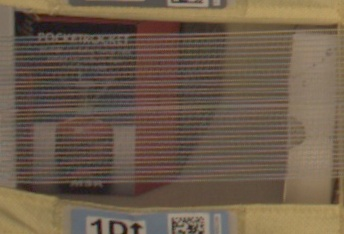

In [32]:
from PIL import Image
import io
Image.open(io.BytesIO(img_bytes))

In [41]:
import json
response=predictor.predict(img_bytes, initial_args={"ContentType": "image/jpeg"})
response2=predictor.predict(json.dumps(request_dict), initial_args={"ContentType": "application/json"})
import numpy as np
print(np.argmax(response2, 1))
print(np.argmax(response, 1))

[2]
[2]
